In [1]:
from pathlib import Path

import pandas as pd
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import matplotlib.pylab as plt
import numpy as np
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary
import seaborn as sns
from dmba import classificationSummary, gainsChart, liftChart
from dmba.metric import AIC_score
%matplotlib inline


In [2]:
file_path = 'dhishyaAI.xlsx'

# Read the specific sheet into a DataFrame
osum_df = pd.read_excel(file_path, sheet_name='Training Data 20000')
test_df= pd.read_excel(file_path, sheet_name='Test Data for LR and DT')
tag_df= pd.read_excel(file_path, sheet_name='Data for Visualization')

# Display the first few rows of the DataFrame
#print(osum_df.head())
osum_df.shape
#tag_df.shape
teste_df=test_df

In [3]:
teste_df=test_df.copy()
o_osum_df=osum_df.copy()
a_osum_df=osum_df.copy()

In [4]:
# Display current column names
print("Original test Column Names:", teste_df.columns.tolist())

# Clean the column names
teste_df.columns = (
    teste_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:", teste_df.columns.tolist())

Original test Column Names: ['S NO', 'SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Others', 'Pressure', 'Temperature', 'H', 'Hour 0-6', 'Hour 7-12', 'Hour 13-18', 'Hour 19-24', 'D', '1st Week', '2nd Week', '3rd Week', '4th Week', 'Z', 'Exp(Z)', 'P(Y=1)', 'Unnamed: 24', 'Unnamed: 25']
Cleaned test Column Names: ['s_no', 'so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'others', 'pressure', 'temperature', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'd', '1st_week', '2nd_week', '3rd_week', '4th_week', 'z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']


In [5]:
# Display current column names
print("Original Column Names:", osum_df.columns.tolist())

# Clean the column names
osum_df.columns = (
    osum_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", osum_df.columns.tolist())


Original Column Names: ['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [6]:
#focus on 'Evap 1', 'Evap 2', 'Evap 3', 'Evap 4', 'Evap 1 & 2', 'Evap 3 & 4' alarm tags alone

In [7]:
# Define the specific groupings you are interested in
target_groupings = ['Evap 1', 'Evap 2', 'Evap 3', 'Evap 4', 'Evap 1 & 2', 'Evap 3 & 4']

# Filter the DataFrame for the target groupings using 'isin' method
filtered_df = tag_df[tag_df['Grouping of Alarms'].isin(target_groupings)]

# Extract unique TagName values
unique_tagnames = filtered_df['TagName'].unique()

# Convert to list (if needed)
unique_tagnames_list = list(unique_tagnames)

# Output the unique tag names
len(unique_tagnames_list)

# Convert the unique_tagnames_list to a set for faster lookup
unique_tagnames_set = set(unique_tagnames_list)
print(len(unique_tagnames_set))
# Filter osum_df based on matching 'so' values with the unique tag names
evap_df = osum_df[osum_df['so'].isin(unique_tagnames_set)]

# Count the number of matching rows
matching_rows_count =evap_df.shape[0]

# Output the count of matching rows
print(f"Number of matching rows in 'osum_df': {matching_rows_count}")
print(evap_df)

110
Number of matching rows in 'osum_df': 6054
              so   atd  chb   m alarm_tag_type  flow  level  pressure  \
1002   FAL-3452A     4    1  11           Flow     1      0         0   
1003   FAL-3452A     4    1  12           Flow     1      0         0   
1004   FAL-3452A     4    1  12           Flow     1      0         0   
1005   FAL-3452A     4    0  11           Flow     1      0         0   
1006    FAL-3480     4    0   3           Flow     1      0         0   
...          ...   ...  ...  ..            ...   ...    ...       ...   
19990   TAH-3371  2476    0  11    Temperature     0      0         0   
19991   TAL-3046  2476    0   8    Temperature     0      0         0   
19992   FAL-3480  2478    0   5           Flow     1      0         0   
19995  LAL-3801C  2485    0   5          Level     0      1         0   
19996  LAL-3801C  2492    0  12          Level     0      1         0   

       temperature  others      h  hour_0_6  hour_7_12  hour_13_18  \
1002  

In [8]:
teste_df.columns

Index(['s_no', 'so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level',
       'others', 'pressure', 'temperature', 'h', 'hour_0_6', 'hour_7_12',
       'hour_13_18', 'hour_19_24', 'd', '1st_week', '2nd_week', '3rd_week',
       '4th_week', 'z', 'expz', 'py1', 'unnamed__24', 'unnamed__25'],
      dtype='object')

In [9]:
# Filter osum_df based on matching 'so' values with the unique tag names
teste_filter_df = teste_df[teste_df['so'].isin(unique_tagnames_set)]

# Count the number of matching rows
matching_rows_count =teste_filter_df.shape[0]

# Output the count of matching rows
print(f"Number of matching rows in 'osum_df': {matching_rows_count}")
print(teste_filter_df)

Number of matching rows in 'osum_df': 44
      s_no          so  atd  chb   m alarm_tag_type  flow  level  others  \
163    839   VAH-3386B    5    0   4         Others     0      0       1   
164    851  VAHH-3386A    5    0  12         Others     0      0       1   
165    852  VAHH-3386A    5    0  12         Others     0      0       1   
179    746   VAH-3049A    6    0   9         Others     0      0       1   
182    841   VAH-3386B    6    0   9         Others     0      0       1   
190    828   VAH-3386A    7    0  12         Others     0      0       1   
198    856  VAHH-3386A    8    0  11         Others     0      0       1   
199    857  VAHH-3386B    8    0  12         Others     0      0       1   
209    837   VAH-3386B    9    0  12         Others     0      0       1   
278    835   VAH-3386A   10    0  11         Others     0      0       1   
415    747   VAH-3049A    5    0  10         Others     0      0       1   
416    749   VAH-3049A    5    0   7         Ot

In [10]:
columns_to_drop = ['s_no','so','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# Drop the specified columns
teste_df = teste_df.drop(columns=columns_to_drop)

# Check the resulting DataFrame
print(teste_df.head())
teste_df.shape

   atd  chb  m  level  others  pressure  temperature  hour_7_12  hour_13_18  \
0    1    0  4      0       0         1            0          0           0   
1    1    0  4      0       0         1            0          0           0   
2    1    0  4      0       0         1            0          0           0   
3    1    0  4      0       0         1            0          0           0   
4    1    0  4      0       0         1            0          0           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           1         0         1         0  
1           1         0         1         0  
2           1         0         1         0  
3           1         0         1         0  
4           1         0         1         0  


(2000, 13)

In [11]:
# Count the number of rows where 'chb' column value is 1
matching_chb_rows_count = evap_df[evap_df['chb'] == 1].shape[0]

# Output the count of rows with 'chb' value 1
print(f"Number of rows with 'chb' value 1: {matching_chb_rows_count}")

Number of rows with 'chb' value 1: 1569


In [12]:
# Display current column names
print("Original Column Names:", evap_df.columns.tolist())

# Clean the column names
evap_df.columns = (
    evap_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", evap_df.columns.tolist())

Original Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [13]:
columns_to_drop = ['so','h', 'hour_0_6', 'alarm_tag_type', 'flow', 'week', '1st_week']

# Drop the specified columns
evap_df = evap_df.drop(columns=columns_to_drop)
evap_df = evap_df.reset_index(drop=True)  # Reset index of evap_df if necessary

# Check the resulting DataFrame
print(evap_df.head())

   atd  chb   m  level  pressure  temperature  others  hour_7_12  hour_13_18  \
0    4    1  11      0         0            0       0          0           0   
1    4    1  12      0         0            0       0          0           1   
2    4    1  12      0         0            0       0          0           1   
3    4    0  11      0         0            0       0          1           0   
4    4    0   3      0         0            0       0          0           0   

   hour_19_24  2nd_week  3rd_week  4th_week  
0           1         0         0         0  
1           0         0         1         0  
2           0         0         1         0  
3           0         0         0         0  
4           1         0         0         1  


In [14]:
evap_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week'],
      dtype='object')

In [15]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData= evap_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData =evap_df.drop(trainData.index)

In [16]:
trainData.head()

,atd,chb,m,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,2nd_week,3rd_week,4th_week
1056,5,1,4,0,1,0,0,0,0,1,1,0,0
301,5,1,11,0,0,0,0,1,0,0,0,0,0
2420,11,1,6,0,1,0,0,1,0,0,1,0,0
3510,37,0,6,1,0,0,0,1,0,0,1,0,0
3169,25,0,6,1,0,0,0,0,0,1,1,0,0


In [17]:
trainData.index

Index([1056,  301, 2420, 3510, 3169, 4299,  234, 2720, 5720, 5438,
       ...
       3934, 1688, 1347, 4049, 1708, 4282,  160,  670, 1266,  353],
      dtype='int64', length=3632)

In [18]:
trainData.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week'],
      dtype='object')

In [19]:
validData.index

Index([   0,    2,    8,   14,   15,   18,   20,   23,   24,   27,
       ...
       6016, 6020, 6026, 6028, 6031, 6034, 6037, 6045, 6047, 6051],
      dtype='int64', length=2422)

In [20]:
print(trainData[['atd', 'm']].isnull().sum())  # Check for missing values in 'atd' and 'm'


atd    0
m      0
dtype: int64


In [21]:
#normalization 
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['atd', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']])  # Note the use of an array of column names

# Transform the full dataset
evapNorm = pd.concat([pd.DataFrame(scaler.transform(evap_df[['atd', 'm','level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]), columns=['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']),evap_df[['chb']]], axis=1)
evapNorm.columns
print(evapNorm.isnull().sum())  # Check for missing values after scaling

trainNorm = evapNorm.iloc[trainData.index]
# #Similarly, get the valid one as well
validNorm = evapNorm.iloc[validData.index]
# Transform the test dataset evap
testNorme= pd.concat([pd.DataFrame(scaler.transform(teste_df[['atd', 'm','level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week']]), columns=['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']), teste_df[['chb']]], axis=1)

zatd            0
zm              0
zlevel          0
zpressure       0
ztemperature    0
zothers         0
zhour_7_12      0
zhour_13_18     0
zhour_19_24     0
z2nd_week       0
z3rd_week       0
z4th_week       0
chb             0
dtype: int64


In [22]:
trainNorm.head()

,zatd,zm,zlevel,zpressure,ztemperature,zothers,zhour_7_12,zhour_13_18,zhour_19_24,z2nd_week,z3rd_week,z4th_week,chb
1056,-0.416851,-0.811753,-0.737711,2.669322,-0.507561,-0.270128,-0.604494,-0.664281,2.034011,1.641588,-0.632577,-0.655684,1
301,-0.416851,1.054589,-0.737711,-0.374627,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,-0.609166,-0.632577,-0.655684,1
2420,-0.401684,-0.278512,-0.737711,2.669322,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,1.641588,-0.632577,-0.655684,1
3510,-0.335959,-0.278512,1.355544,-0.374627,-0.507561,-0.270128,1.654275,-0.664281,-0.491640,1.641588,-0.632577,-0.655684,0
3169,-0.366294,-0.278512,1.355544,-0.374627,-0.507561,-0.270128,-0.604494,-0.664281,2.034011,1.641588,-0.632577,-0.655684,0


In [23]:
knn = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']], trainNorm['chb'])

In [24]:
valid_pred=knn.predict(validNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week']])

In [25]:
accuracy_score(validNorm['chb'] ,valid_pred)

0.898018166804294

In [26]:
cm = confusion_matrix(validNorm['chb'],valid_pred)

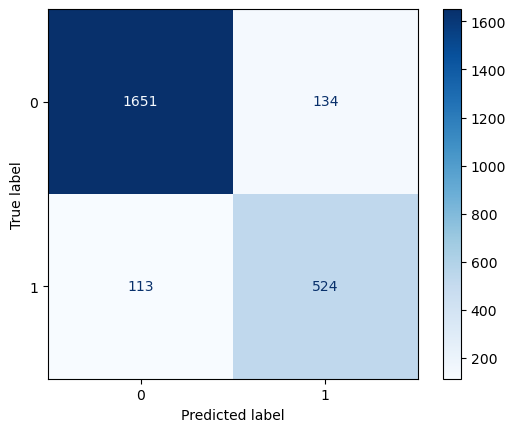

In [27]:
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
cm_display.plot(cmap='Blues')


In [28]:
FN = cm[1, 0]  # False Negatives
TP = cm[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")


False Negative Rate: 0.18


In [29]:
#knn best K 
train_X = trainNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']]
train_y = trainNorm['chb']
valid_X = validNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']]
valid_y = validNorm['chb']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

     k  accuracy
0    1  0.875310
1    2  0.882329
2    3  0.898018
3    4  0.895128
4    5  0.897192
5    6  0.901321
6    7  0.894302
7    8  0.895128
8    9  0.891412
9   10  0.896780
10  11  0.894715
11  12  0.894302
12  13  0.887696
13  14  0.888935
14  15  0.888522
15  16  0.888935
16  17  0.883154
17  18  0.888522
18  19  0.884393
19  20  0.884806
20  21  0.882329
21  22  0.883154
22  23  0.881503
23  24  0.881090
24  25  0.878200
25  26  0.879026
26  27  0.879026
27  28  0.877787
28  29  0.874071
29  30  0.875310
30  31  0.873245
31  32  0.872832
32  33  0.871594
33  34  0.871594
34  35  0.869942
35  36  0.869942
36  37  0.868291
37  38  0.869116
38  39  0.869116
Max Accuracy: 0.9013212221304707 at k = 6


In [30]:
knn1 = KNeighborsClassifier(n_neighbors=6).fit(trainNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']], trainNorm['chb'])

In [31]:
valid_pred1=knn1.predict(validNorm[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']])

In [32]:
accuracy_score(validNorm['chb'] ,valid_pred1)

0.9013212221304707

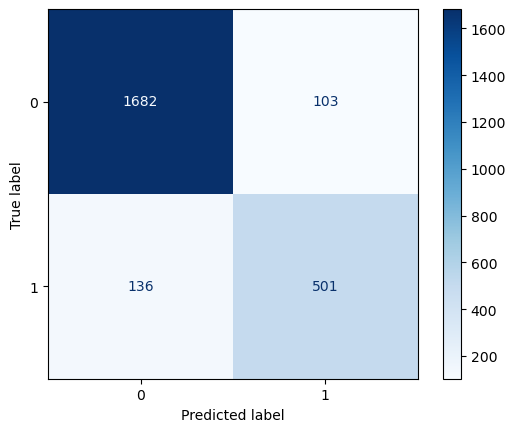

In [33]:
cm_e_VALID= confusion_matrix(validNorm['chb'] ,valid_pred1)
cm_display_eVALID= ConfusionMatrixDisplay(confusion_matrix=cm_e_VALID, display_labels=knn1.classes_)
cm_display_eVALID.plot(cmap='Blues')

In [34]:
FN = cm_e_VALID[1, 0]  # False Negatives
TP = cm_e_VALID[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")


False Negative Rate: 0.21


In [35]:
test_pred_e=knn1.predict(testNorme[['zatd', 'zm', 'zlevel', 'zpressure', 'ztemperature', 'zothers','zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week','z4th_week']])

In [36]:
accuracy_score(testNorme['chb'] ,test_pred_e)


0.739

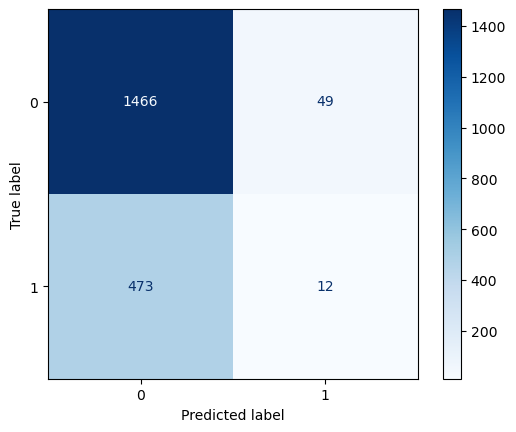

In [37]:
cm_e_full= confusion_matrix(testNorme['chb'] ,test_pred_e)
cm_display_efull= ConfusionMatrixDisplay(confusion_matrix=cm_e_full, display_labels=knn1.classes_)
cm_display_efull.plot(cmap='Blues')

In [38]:
# print(teste_filter_df)

In [39]:
# columns_to_drop = ['s_no','so','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# # Drop the specified columns
# teste_filter_df =teste_filter_df.drop(columns=columns_to_drop)

# # Check the resulting DataFrame
# print(teste_filter_df.head())
# teste_filter_df.shape

In [40]:

# teste_filter_df= teste_filter_df.reset_index(drop=True)
# # Check the resulting DataFrame
# print(teste_filter_df.head())
# teste_filter_df.shape

In [41]:
# testNorme_filter= pd.concat([pd.DataFrame(scaler.transform(teste_filter_df[['atd', 'm']]), 
#                                     columns=['zatd', 'zm']),
#                       teste_filter_df[['chb', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']]], axis=1)

In [42]:
#print(testNorme_filter.head())

In [43]:
# test_pred_e_filter=knn1.predict(testNorme_filter[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']])

In [44]:
# accuracy_score(testNorme_filter['chb'] ,test_pred_e_filter)

In [45]:
# cm_e_filter= confusion_matrix(testNorme_filter['chb'] ,test_pred_e_filter)
# cm_display_efilter= ConfusionMatrixDisplay(confusion_matrix=cm_e_filter, display_labels=knn1.classes_)
# cm_display_efilter.plot(cmap='Blues')

In [46]:
# # Perform 5-fold cross-validation

# scores = cross_val_score(knn1,evapNorm[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week']], evapNorm['chb'], cv=10)

# print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
# print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
# print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

taking the top 10 common chattering alarm tags . feature engineering . renaming other alarm tags as others 

In [47]:
# Table 1: Count of Unique Values in 'so' Column and Their Occurrences
table_1 = osum_df['so'].value_counts().reset_index()
table_1.columns = ['so', 'count']

# Table 2: Count and Percentage of 'chb' = 1 for Each Unique 'so'
table_2 = osum_df.groupby('so').agg(
    chb_1_count=('chb', lambda x: (x == 1).sum()),  # Count of 'chb' == 1 for each 'so'
    chb_1_percentage=('chb', lambda x: (x == 1).mean() * 100)  # Percentage of 'chb' == 1 for each 'so'
).reset_index()
# Merge table_1 and table_2 to get a complete view
final_table = pd.merge(table_1, table_2, on='so')
# Merge table_1 and table_2 to get a complete view
final_table_sorted = final_table.sort_values(by='chb_1_count', ascending=False).reset_index(drop=True)

# Display the sorted final table
print("Sorted Final Table: Counts and Percentages of 'chb' = 1 for Each Unique 'so'")
print(final_table_sorted.head(50))

Sorted Final Table: Counts and Percentages of 'chb' = 1 for Each Unique 'so'
            so  count  chb_1_count  chb_1_percentage
0     PAH-3200    698          463         66.332378
1    XASS-3140    517          372         71.953578
2   FALL-3452A    531          343         64.595104
3    FAL-3452A    516          331         64.147287
4    PDAH-3190    449          268         59.688196
5     FAL-3020    262          217         82.824427
6    LDAH-3708    214          197         92.056075
7     PAL-3390    202          157         77.722772
8    PDIT-3091    158          154         97.468354
9     PAL-3356    148          134         90.540541
10   PDAH-3094    141          127         90.070922
11    PIT-3029    106           93         87.735849
12    LIT-3503    100           90         90.000000
13    TAH-3038    435           80         18.390805
14    FAL-3480    347           79         22.766571
15   LAHH-3503     88           72         81.818182
16     XA-3486     90 

In [48]:
# Create a new table where chb_1_percentage is above 55
filtered_table = final_table_sorted[final_table_sorted['chb_1_percentage'] > 55]
chb_1_count_sum = filtered_table.head(5)['count'].sum()
# Display the filtered table
print("Filtered Table: chb_1_percentage above 55")
print(filtered_table)
print(chb_1_count_sum)

Filtered Table: chb_1_percentage above 55
             so  count  chb_1_count  chb_1_percentage
0      PAH-3200    698          463         66.332378
1     XASS-3140    517          372         71.953578
2    FALL-3452A    531          343         64.595104
3     FAL-3452A    516          331         64.147287
4     PDAH-3190    449          268         59.688196
5      FAL-3020    262          217         82.824427
6     LDAH-3708    214          197         92.056075
7      PAL-3390    202          157         77.722772
8     PDIT-3091    158          154         97.468354
9      PAL-3356    148          134         90.540541
10    PDAH-3094    141          127         90.070922
11     PIT-3029    106           93         87.735849
12     LIT-3503    100           90         90.000000
15    LAHH-3503     88           72         81.818182
16      XA-3486     90           70         77.777778
17     PAL-3372     67           64         95.522388
18     FSL-3511     71           63     

In [49]:
osum_df.columns

Index(['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure',
       'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18',
       'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week'],
      dtype='object')

In [50]:
# Define the list of desired 'so' values
desired_so_values = ['PAH-3200', 'XASS-3140', 'FALL-3452A', 'FAL-3452A', 
                     'PDAH-3190', 'FAL-3020', 'LDAH-3708', 
                     'PAL-3390', 'PDIT-3091', 'PAL-3356']

# Update 'so' column: Keep desired values, rename others as 'Other'
osum_df['so'] = osum_df['so'].apply(lambda x: x if x in desired_so_values else 'Other_alarm')


In [51]:
print(osum_df['so'])

0        Other_alarm
1        Other_alarm
2        Other_alarm
3        Other_alarm
4        Other_alarm
            ...     
19995    Other_alarm
19996    Other_alarm
19997    Other_alarm
19998    Other_alarm
19999    Other_alarm
Name: so, Length: 20000, dtype: object


In [52]:
# Count the number of rows with 'Other' in the 'so' column
other_count = osum_df[osum_df['so'] == 'Other_alarm'].shape[0]

print(f"Number of rows with 'Other' as the value in the 'so' column: {other_count}")


Number of rows with 'Other' as the value in the 'so' column: 16305


In [53]:
print(osum_df.head(20))

             so  atd  chb   m alarm_tag_type  flow  level  pressure  \
0   Other_alarm    0    0   6         Others     0      0         0   
1   Other_alarm    0    0   7         Others     0      0         0   
2   Other_alarm    0    0   7         Others     0      0         0   
3   Other_alarm    0    0  10         Others     0      0         0   
4   Other_alarm    0    0  10         Others     0      0         0   
5   Other_alarm    0    0   6         Others     0      0         0   
6   Other_alarm    1    0  12         Others     0      0         0   
7   Other_alarm    1    0  12         Others     0      0         0   
8   Other_alarm    1    0  12         Others     0      0         0   
9   Other_alarm    1    0  12         Others     0      0         0   
10  Other_alarm    1    0  12         Others     0      0         0   
11  Other_alarm    1    1  12         Others     0      0         0   
12  Other_alarm    1    0   1         Others     0      0         0   
13  Ot

In [54]:
columns_to_drop_osum= ['h', 'hour_0_6', 'alarm_tag_type', 'flow', 'week', '1st_week']

# Drop the specified columns
osum_df = osum_df.drop(columns=columns_to_drop_osum)

# Check the resulting DataFrame
print(osum_df.head())

            so  atd  chb   m  level  pressure  temperature  others  hour_7_12  \
0  Other_alarm    0    0   6      0         0            0       1          1   
1  Other_alarm    0    0   7      0         0            0       1          0   
2  Other_alarm    0    0   7      0         0            0       1          0   
3  Other_alarm    0    0  10      0         0            0       1          0   
4  Other_alarm    0    0  10      0         0            0       1          1   

   hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0           0           0         0         0         1  
1           1           0         1         0         0  
2           1           0         1         0         0  
3           1           0         1         0         0  
4           0           0         1         0         0  


In [55]:
#convert to dummy variables
osum_df = pd.get_dummies(osum_df, prefix_sep='_',dtype='int', drop_first=False)
osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020', 'so_FAL-3452A', 'so_FALL-3452A',
       'so_LDAH-3708', 'so_Other_alarm', 'so_PAH-3200', 'so_PAL-3356',
       'so_PAL-3390', 'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140'],
      dtype='object')

In [56]:
if 'so_Other_alarm' in osum_df.columns:
    osum_df.drop(columns=['so_Other_alarm'], inplace=True)
osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020', 'so_FAL-3452A', 'so_FALL-3452A',
       'so_LDAH-3708', 'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390',
       'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140'],
      dtype='object')

In [57]:
osum_df.shape

(20000, 23)

In [58]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData1= osum_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData1=osum_df.drop(trainData1.index)

In [59]:
trainData1.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020', 'so_FAL-3452A', 'so_FALL-3452A',
       'so_LDAH-3708', 'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390',
       'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140'],
      dtype='object')

In [60]:
validData1.shape

(8000, 23)

In [61]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData1[['atd', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020','so_FAL-3452A', 'so_FALL-3452A', 'so_LDAH-3708',
       'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390',
       'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140']])  # Note the use of an array of column names

# Transform the full dataset
osumNorm = pd.concat([pd.DataFrame(scaler.transform(osum_df[['atd', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020','so_FAL-3452A', 'so_FALL-3452A', 'so_LDAH-3708',
       'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390',
       'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140']]), 
                                    columns=['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']),
                       osum_df[['chb']]], axis=1)
trainNorm1= osumNorm.iloc[trainData1.index]
#Similarly, get the valid one as well
validNorm1= osumNorm.iloc[validData1.index]

In [62]:
trainNorm1.shape
#trainNorm.columns

(12000, 23)

In [63]:
knn_t10= KNeighborsClassifier(n_neighbors=3).fit(trainNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']], trainNorm1['chb'])

In [64]:
valid_pred_t10=knn_t10.predict(validNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']])

In [65]:
accuracy_score(validNorm1['chb'] ,valid_pred_t10)

0.904125

In [66]:
validNorm1.shape

(8000, 23)

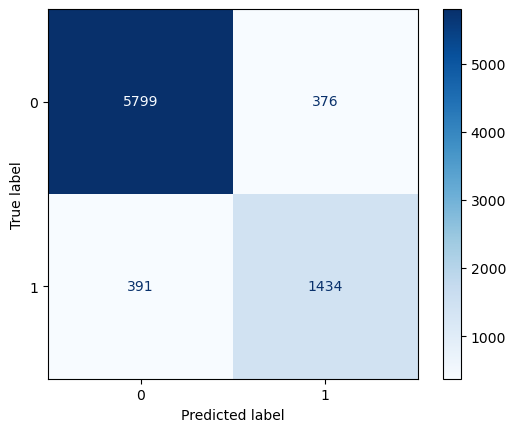

In [67]:
cm_o_valid= confusion_matrix(validNorm1['chb'] ,valid_pred_t10)
cm_display_oVALID= ConfusionMatrixDisplay(confusion_matrix=cm_o_valid, display_labels=knn_t10.classes_)
cm_display_oVALID.plot(cmap='Blues')

In [68]:
FN = cm_o_valid[1, 0]  # False Negatives
TP = cm_o_valid[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.21


In [69]:
#test
train_X_t10 = trainNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']]
train_y_t10= trainNorm1['chb']
valid_X_t10= validNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']]
valid_y_t10= validNorm1['chb']
results_t10= []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X_t10, train_y_t10)
    accuracy = accuracy_score(valid_y_t10, knn.predict(valid_X_t10))
    results_t10.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results_t10= pd.DataFrame(results_t10)

# Print the results and the best k value
print(results_t10)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

     k  accuracy
0    1  0.891500
1    2  0.896875
2    3  0.904125
3    4  0.905000
4    5  0.903750
5    6  0.904625
6    7  0.904875
7    8  0.904125
8    9  0.901500
9   10  0.901750
10  11  0.899750
11  12  0.902250
12  13  0.898500
13  14  0.897500
14  15  0.896750
15  16  0.893375
16  17  0.894125
17  18  0.892875
18  19  0.892000
19  20  0.891375
20  21  0.889625
21  22  0.888750
22  23  0.886250
23  24  0.886625
24  25  0.887875
25  26  0.887750
26  27  0.885375
27  28  0.885625
28  29  0.885125
29  30  0.885375
30  31  0.883625
31  32  0.882750
32  33  0.883750
33  34  0.884000
34  35  0.882500
35  36  0.880125
36  37  0.882500
37  38  0.880875
38  39  0.879750
Max Accuracy: 0.905 at k = 4


In [70]:
knn_t10_k= KNeighborsClassifier(n_neighbors=4).fit(trainNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']], trainNorm1['chb'])

In [71]:
valid_pred_t10_k=knn_t10_k.predict(validNorm1[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers',
       'zhour_7_12', 'zhour_13_18', 'zhour_19_24', 'z2nd_week', 'z3rd_week',
       'z4th_week', 'zso_FAL-3020','zso_FAL-3452A', 'zso_FALL-3452A', 'zso_LDAH-3708',
       'zso_PAH-3200', 'zso_PAL-3356', 'zso_PAL-3390',
       'zso_PDAH-3190', 'zso_PDIT-3091', 'zso_XASS-3140']])

In [72]:
accuracy_score(validNorm1['chb'] ,valid_pred_t10_k)

0.905

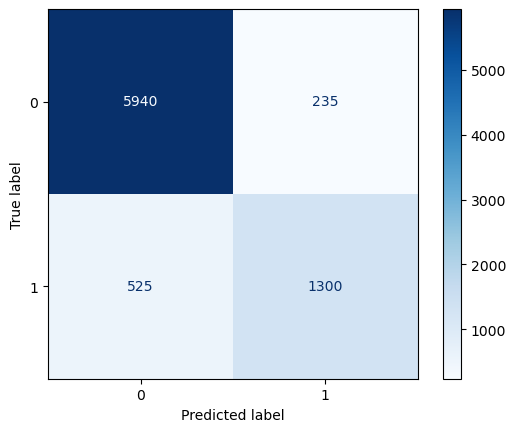

In [73]:
cm_o_validk= confusion_matrix(validNorm1['chb'] ,valid_pred_t10_k)
cm_display_oVALIDk= ConfusionMatrixDisplay(confusion_matrix=cm_o_validk, display_labels=knn_t10_k.classes_)
cm_display_oVALIDk.plot(cmap='Blues')

In [74]:
FN = cm_o_validk[1, 0]  # False Negatives
TP = cm_o_validk[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.29


In [75]:
# fit_features = list(knn_t10.feature_names_in_)
# print(fit_features)


In [76]:
# # Display current column names
# print("Original Column Names:", test_df.columns.tolist())

# # Clean the column names
# test_df.columns = (
#     test_df.columns
#     .str.strip()                # Remove leading and trailing spaces
#     .str.lower()                # Convert to lowercase
#     .str.replace(' ', '_')      # Replace spaces with underscores
#     .str.replace(':', '_')      # Replace colons with underscores
#     .str.replace('-', '_')      # Replace hyphens with underscores
#     .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
# )

# # Display cleaned column names
# print("Cleaned Column Names:", test_df.columns.tolist())

In [77]:
# # Update 'so' column: Keep desired values, rename others as 'Other'_df['so'] = osum_df['so'].apply(lambda x: x if x in desired_so_values else 'Other_alarm')
# test_df['so'] = test_df['so'].apply(lambda x: x if x in desired_so_values else 'Other_alarm')

In [78]:
# # Count the number of rows with 'Other' in the 'so' column
# other_count = test_df[test_df['so'] == 'Other_alarm'].shape[0]

# print(f"Number of rows with 'Other' as the value in the 'so' column: {other_count}")


In [79]:
# columns_to_drop_test1= ['s_no','h', 'hour_0_6', 'alarm_tag_type', 'flow','d', '1st_week','z', 'expz', 'py1', 'unnamed__24', 'unnamed__25']

# # Drop the specified columns
# test_df = test_df.drop(columns=columns_to_drop_test1)

# # Check the resulting DataFrame
# print(test_df.head())


In [80]:
# #convert to dummy variables
# test_df = pd.get_dummies(test_df, prefix_sep='_',dtype='int', drop_first=True)
# test_df.columns

In [81]:
# #Scale the new data
# # Transform the full dataset
# testNorm_t10= pd.concat([pd.DataFrame(scaler.transform(test_df[['atd', 'm']]), 
#                                     columns=['zatd', 'zm']),
#                        test_df[['chb', 'level', 'others', 'pressure', 'temperature',
#        'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
#        '4th_week', 'so_XASS-3140']]], axis=1)

In [82]:
# testNorm_t10.columns

In [83]:
# testNorm_t10_edited = testNorm_t10.reindex(columns=fit_features, fill_value=0)
# #print(testNorm_t10_edited['chb'])

In [84]:
# print(testNorm_t10_edited.columns)

In [85]:
# test_pred_t10=knn_t10.predict(testNorm_t10_edited[['zatd', 'zm', 'level', 'pressure', 'temperature', 'others', 'hour_7_12',
#        'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week', '4th_week',
#        'so_FAL-3020','so_FAL-3452A', 'so_FALL-3452A', 'so_LDAH-3708', 'so_PAH-3200',
#        'so_PAL-3356', 'so_PAL-3390', 'so_PDAH-3190', 'so_PDIT-3091',
#        'so_XASS-3140']])

In [86]:
# accuracy_score(testNorm_t10['chb'] ,test_pred_t10)

In [87]:
#overall 'so' column processing

In [88]:
o_osum_df.columns

Index(['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure',
       'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18',
       'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week'],
      dtype='object')

In [89]:
o_osum_df['SO'] = o_osum_df['SO'].str.split('-').str[0]

In [90]:
o_osum_df

,SO,ATD,CHB,M,Alarm Tag Type,Flow,Level,Pressure,Temperature,Others,H,Hour:0-6,Hour:7-12,Hour:13-18,Hour:19-24,Week,1st Week,2nd week,3rd week,4th week
0,XI,0,0,6,Others,0,0,0,0,1,7-12,0,1,0,0,4th Week,0,0,0,1
1,XI,0,0,7,Others,0,0,0,0,1,13-18,0,0,1,0,2nd Week,0,1,0,0
2,XI,0,0,7,Others,0,0,0,0,1,13-18,0,0,1,0,2nd Week,0,1,0,0
3,XI,0,0,10,Others,0,0,0,0,1,13-18,0,0,1,0,2nd Week,0,1,0,0
4,XI,0,0,10,Others,0,0,0,0,1,7-12,0,1,0,0,2nd Week,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,LAL,2485,0,5,Level,0,1,0,0,0,13-18,0,0,1,0,4th Week,0,0,0,1
19996,LAL,2492,0,12,Level,0,1,0,0,0,7-12,0,1,0,0,3rd Week,0,0,1,0
19997,FAL,2502,0,8,Flow,1,0,0,0,0,13-18,0,0,1,0,2nd Week,0,1,0,0
19998,TAL,2502,0,7,Temperature,0,0,0,1,0,7-12,0,1,0,0,4th Week,0,0,0,1


In [91]:
# Count the number of unique values in the 'so' column
unique_count_so= o_osum_df['SO'].nunique()
print(f"Number of unique values in the 'so' column: {unique_count_so}")


Number of unique values in the 'so' column: 56


In [92]:
# Display current column names
print("Original test Column Names:", o_osum_df.columns.tolist())

# Clean the column names
o_osum_df.columns = (
    o_osum_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned test Column Names:",o_osum_df.columns.tolist())

Original test Column Names: ['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned test Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [93]:
columns_to_drop_osumo= ['h', 'hour_0_6', 'alarm_tag_type', 'flow', 'week', '1st_week']

# Drop the specified columns
o_osum_df = o_osum_df.drop(columns=columns_to_drop_osumo)

# Check the resulting DataFrame
print(o_osum_df.head())

   so  atd  chb   m  level  pressure  temperature  others  hour_7_12  \
0  XI    0    0   6      0         0            0       1          1   
1  XI    0    0   7      0         0            0       1          0   
2  XI    0    0   7      0         0            0       1          0   
3  XI    0    0  10      0         0            0       1          0   
4  XI    0    0  10      0         0            0       1          1   

   hour_13_18  hour_19_24  2nd_week  3rd_week  4th_week  
0           0           0         0         0         1  
1           1           0         1         0         0  
2           1           0         1         0         0  
3           1           0         1         0         0  
4           0           0         1         0         0  


In [94]:
#convert to dummy variables
o_osum_df = pd.get_dummies(o_osum_df, prefix_sep='_',dtype='int', drop_first=True)
o_osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_AAHH', 'so_AAL', 'so_AT', 'so_DAH', 'so_DAHH', 'so_EAL',
       'so_ESDV', 'so_FAH', 'so_FAL', 'so_FALL', 'so_FIC', 'so_FIT', 'so_FSL',
       'so_FT', 'so_HTCP', 'so_HTP', 'so_IT', 'so_KM', 'so_LAH', 'so_LAHH',
       'so_LAL', 'so_LALL', 'so_LALLL', 'so_LDAH', 'so_LIT', 'so_LSHH',
       'so_LT', 'so_MM', 'so_PAH', 'so_PAHH', 'so_PAL', 'so_PALL', 'so_PDAH',
       'so_PDIT', 'so_PIT', 'so_PM', 'so_PT', 'so_SC', 'so_ST', 'so_TAH',
       'so_TAHH', 'so_TAL', 'so_TDAH', 'so_TIT', 'so_TT', 'so_UA', 'so_UXA',
       'so_VAH', 'so_VAHH', 'so_VIT', 'so_XA', 'so_XASS', 'so_XI', 'so_XV',
       'so_ZA'],
      dtype='object')

In [95]:
o_osum_df.head()

,atd,chb,m,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,...,so_UA,so_UXA,so_VAH,so_VAHH,so_VIT,so_XA,so_XASS,so_XI,so_XV,so_ZA
0,0,0,6,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,10,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,10,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [96]:
#Partition the data into train and valid. Make sure you set seed
# random_state is set to a defined value to get the same partitions when re-running the code
trainData_o= o_osum_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData_o= o_osum_df.drop(trainData_o.index)

In [97]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData_o[['atd', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_AAHH', 'so_AAL', 'so_AT', 'so_DAH', 'so_DAHH', 'so_EAL',
       'so_ESDV', 'so_FAH', 'so_FAL', 'so_FALL', 'so_FIC', 'so_FIT', 'so_FSL',
       'so_FT', 'so_HTCP', 'so_HTP', 'so_IT', 'so_KM', 'so_LAH', 'so_LAHH',
       'so_LAL', 'so_LALL', 'so_LALLL', 'so_LDAH', 'so_LIT', 'so_LSHH',
       'so_LT', 'so_MM', 'so_PAH', 'so_PAHH', 'so_PAL', 'so_PALL', 'so_PDAH',
       'so_PDIT', 'so_PIT', 'so_PM', 'so_PT', 'so_SC', 'so_ST', 'so_TAH',
       'so_TAHH', 'so_TAL', 'so_TDAH', 'so_TIT', 'so_TT', 'so_UA', 'so_UXA',
       'so_VAH', 'so_VAHH', 'so_VIT', 'so_XA', 'so_XASS', 'so_XI', 'so_XV',
       'so_ZA']])  # Note the use of an array of column names

# Transform the full dataset
o_osumNorm = pd.concat([pd.DataFrame(scaler.transform(o_osum_df[['atd', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_AAHH', 'so_AAL', 'so_AT', 'so_DAH', 'so_DAHH', 'so_EAL',
       'so_ESDV', 'so_FAH', 'so_FAL', 'so_FALL', 'so_FIC', 'so_FIT', 'so_FSL',
       'so_FT', 'so_HTCP', 'so_HTP', 'so_IT', 'so_KM', 'so_LAH', 'so_LAHH',
       'so_LAL', 'so_LALL', 'so_LALLL', 'so_LDAH', 'so_LIT', 'so_LSHH',
       'so_LT', 'so_MM', 'so_PAH', 'so_PAHH', 'so_PAL', 'so_PALL', 'so_PDAH',
       'so_PDIT', 'so_PIT', 'so_PM', 'so_PT', 'so_SC', 'so_ST', 'so_TAH',
       'so_TAHH', 'so_TAL', 'so_TDAH', 'so_TIT', 'so_TT', 'so_UA', 'so_UXA',
       'so_VAH', 'so_VAHH', 'so_VIT', 'so_XA', 'so_XASS', 'so_XI', 'so_XV',
       'so_ZA' ]]),  columns=['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers', 'zhour_7_12', 'zhour_13_18', 
    'zhour_19_24', 'z2nd_week', 'z3rd_week', 'z4th_week', 'zso_AAHH', 'zso_AAL', 
    'zso_AT', 'zso_DAH', 'zso_DAHH', 'zso_EAL', 'zso_ESDV', 'zso_FAH', 'zso_FAL', 
    'zso_FALL', 'zso_FIC', 'zso_FIT', 'zso_FSL', 'zso_FT', 'zso_HTCP', 'zso_HTP', 
    'zso_IT', 'zso_KM', 'zso_LAH', 'zso_LAHH', 'zso_LAL', 'zso_LALL', 'zso_LALLL', 
    'zso_LDAH', 'zso_LIT', 'zso_LSHH', 'zso_LT', 'zso_MM', 'zso_PAH', 'zso_PAHH', 
    'zso_PAL', 'zso_PALL', 'zso_PDAH', 'zso_PDIT', 'zso_PIT', 'zso_PM', 'zso_PT', 
    'zso_SC', 'zso_ST', 'zso_TAH', 'zso_TAHH', 'zso_TAL', 'zso_TDAH', 'zso_TIT', 
    'zso_TT', 'zso_UA', 'zso_UXA', 'zso_VAH', 'zso_VAHH', 'zso_VIT', 'zso_XA', 
    'zso_XASS', 'zso_XI', 'zso_XV', 'zso_ZA']),o_osum_df[['chb']]], axis=1)
trainNorm_o= o_osumNorm.iloc[trainData_o.index]
#Similarly, get the valid one as well
validNorm_o= o_osumNorm.iloc[validData_o.index]

In [98]:
trainNorm_o.head()

,zatd,zm,zlevel,zpressure,ztemperature,zothers,zhour_7_12,zhour_13_18,zhour_19_24,z2nd_week,...,zso_UXA,zso_VAH,zso_VAHH,zso_VIT,zso_XA,zso_XASS,zso_XI,zso_XV,zso_ZA,chb
11456,-0.372670,0.616393,-0.751493,-0.436436,-0.362540,1.917430,1.653380,-0.658423,-0.505463,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
16528,0.207208,-0.216758,-0.751493,-0.436436,2.758319,-0.521531,-0.604822,1.518781,-0.505463,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
3253,-0.471733,0.338676,-0.751493,2.291288,-0.362540,-0.521531,1.653380,-0.658423,-0.505463,1.552125,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,1
18614,1.714891,-1.605344,-0.751493,-0.436436,-0.362540,1.917430,-0.604822,-0.658423,1.978384,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,0
1544,-0.471733,1.171828,-0.751493,-0.436436,-0.362540,-0.521531,-0.604822,-0.658423,1.978384,-0.644278,...,-0.032932,-0.067233,-0.034176,-0.009129,-0.147643,-0.165787,-0.036539,-0.077148,-0.009129,1


In [99]:
knn_o= KNeighborsClassifier(n_neighbors=3).fit(trainNorm_o[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers', 'zhour_7_12', 'zhour_13_18', 
    'zhour_19_24', 'z2nd_week', 'z3rd_week', 'z4th_week', 'zso_AAHH', 'zso_AAL', 
    'zso_AT', 'zso_DAH', 'zso_DAHH', 'zso_EAL', 'zso_ESDV', 'zso_FAH', 'zso_FAL', 
    'zso_FALL', 'zso_FIC', 'zso_FIT', 'zso_FSL', 'zso_FT', 'zso_HTCP', 'zso_HTP', 
    'zso_IT', 'zso_KM', 'zso_LAH', 'zso_LAHH', 'zso_LAL', 'zso_LALL', 'zso_LALLL', 
    'zso_LDAH', 'zso_LIT', 'zso_LSHH', 'zso_LT', 'zso_MM', 'zso_PAH', 'zso_PAHH', 
    'zso_PAL', 'zso_PALL', 'zso_PDAH', 'zso_PDIT', 'zso_PIT', 'zso_PM', 'zso_PT', 
    'zso_SC', 'zso_ST', 'zso_TAH', 'zso_TAHH', 'zso_TAL', 'zso_TDAH', 'zso_TIT', 
    'zso_TT', 'zso_UA', 'zso_UXA', 'zso_VAH', 'zso_VAHH', 'zso_VIT', 'zso_XA', 
    'zso_XASS', 'zso_XI', 'zso_XV', 'zso_ZA']], trainNorm_o['chb'])

In [100]:
valid_pred_o=knn_o.predict(validNorm_o[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers', 'zhour_7_12', 'zhour_13_18', 
    'zhour_19_24', 'z2nd_week', 'z3rd_week', 'z4th_week', 'zso_AAHH', 'zso_AAL', 
    'zso_AT', 'zso_DAH', 'zso_DAHH', 'zso_EAL', 'zso_ESDV', 'zso_FAH', 'zso_FAL', 
    'zso_FALL', 'zso_FIC', 'zso_FIT', 'zso_FSL', 'zso_FT', 'zso_HTCP', 'zso_HTP', 
    'zso_IT', 'zso_KM', 'zso_LAH', 'zso_LAHH', 'zso_LAL', 'zso_LALL', 'zso_LALLL', 
    'zso_LDAH', 'zso_LIT', 'zso_LSHH', 'zso_LT', 'zso_MM', 'zso_PAH', 'zso_PAHH', 
    'zso_PAL', 'zso_PALL', 'zso_PDAH', 'zso_PDIT', 'zso_PIT', 'zso_PM', 'zso_PT', 
    'zso_SC', 'zso_ST', 'zso_TAH', 'zso_TAHH', 'zso_TAL', 'zso_TDAH', 'zso_TIT', 
    'zso_TT', 'zso_UA', 'zso_UXA', 'zso_VAH', 'zso_VAHH', 'zso_VIT', 'zso_XA', 
    'zso_XASS', 'zso_XI', 'zso_XV', 'zso_ZA']])

In [101]:
accuracy_score(validNorm_o['chb'] ,valid_pred_o)

0.913375

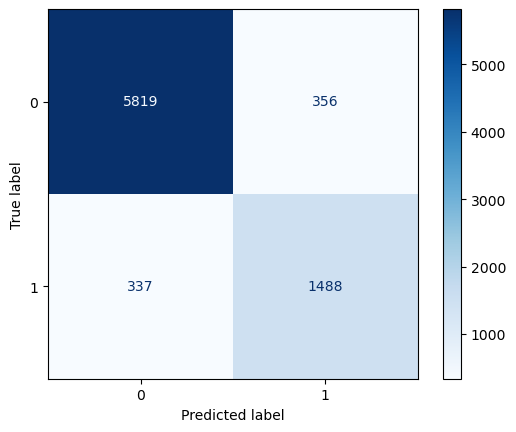

In [102]:
cm_52_validk= confusion_matrix(validNorm_o['chb'] ,valid_pred_o)
cm_display_o52= ConfusionMatrixDisplay(confusion_matrix=cm_52_validk, display_labels=knn_o.classes_)
cm_display_o52.plot(cmap='Blues')

In [103]:
FN = cm_52_validk[1, 0]  # False Negatives
TP = cm_52_validk[1, 1]  # True Positives

FNR = FN / (FN + TP)
print(f"False Negative Rate: {FNR:.2f}")

False Negative Rate: 0.18


In [104]:
#knn best K 
train_X = trainNorm_o[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers', 'zhour_7_12', 'zhour_13_18', 
    'zhour_19_24', 'z2nd_week', 'z3rd_week', 'z4th_week', 'zso_AAHH', 'zso_AAL', 
    'zso_AT', 'zso_DAH', 'zso_DAHH', 'zso_EAL', 'zso_ESDV', 'zso_FAH', 'zso_FAL', 
    'zso_FALL', 'zso_FIC', 'zso_FIT', 'zso_FSL', 'zso_FT', 'zso_HTCP', 'zso_HTP', 
    'zso_IT', 'zso_KM', 'zso_LAH', 'zso_LAHH', 'zso_LAL', 'zso_LALL', 'zso_LALLL', 
    'zso_LDAH', 'zso_LIT', 'zso_LSHH', 'zso_LT', 'zso_MM', 'zso_PAH', 'zso_PAHH', 
    'zso_PAL', 'zso_PALL', 'zso_PDAH', 'zso_PDIT', 'zso_PIT', 'zso_PM', 'zso_PT', 
    'zso_SC', 'zso_ST', 'zso_TAH', 'zso_TAHH', 'zso_TAL', 'zso_TDAH', 'zso_TIT', 
    'zso_TT', 'zso_UA', 'zso_UXA', 'zso_VAH', 'zso_VAHH', 'zso_VIT', 'zso_XA', 
    'zso_XASS', 'zso_XI', 'zso_XV', 'zso_ZA']]
train_y = trainNorm_o['chb']
valid_X = validNorm_o[['zatd', 'zm','zlevel', 'zpressure', 'ztemperature', 'zothers', 'zhour_7_12', 'zhour_13_18', 
    'zhour_19_24', 'z2nd_week', 'z3rd_week', 'z4th_week', 'zso_AAHH', 'zso_AAL', 
    'zso_AT', 'zso_DAH', 'zso_DAHH', 'zso_EAL', 'zso_ESDV', 'zso_FAH', 'zso_FAL', 
    'zso_FALL', 'zso_FIC', 'zso_FIT', 'zso_FSL', 'zso_FT', 'zso_HTCP', 'zso_HTP', 
    'zso_IT', 'zso_KM', 'zso_LAH', 'zso_LAHH', 'zso_LAL', 'zso_LALL', 'zso_LALLL', 
    'zso_LDAH', 'zso_LIT', 'zso_LSHH', 'zso_LT', 'zso_MM', 'zso_PAH', 'zso_PAHH', 
    'zso_PAL', 'zso_PALL', 'zso_PDAH', 'zso_PDIT', 'zso_PIT', 'zso_PM', 'zso_PT', 
    'zso_SC', 'zso_ST', 'zso_TAH', 'zso_TAHH', 'zso_TAL', 'zso_TDAH', 'zso_TIT', 
    'zso_TT', 'zso_UA', 'zso_UXA', 'zso_VAH', 'zso_VAHH', 'zso_VIT', 'zso_XA', 
    'zso_XASS', 'zso_XI', 'zso_XV', 'zso_ZA']]
valid_y = validNorm_o['chb']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

     k  accuracy
0    1  0.894625
1    2  0.903375
2    3  0.913375
3    4  0.913125
4    5  0.907500
5    6  0.905375
6    7  0.904250
7    8  0.902750
8    9  0.897875
9   10  0.899750
10  11  0.897750
11  12  0.899125
12  13  0.896375
13  14  0.895875
14  15  0.891250
15  16  0.892875
16  17  0.887500
17  18  0.888500
18  19  0.888125
19  20  0.888625
20  21  0.885625
21  22  0.883875
22  23  0.885000
23  24  0.884625
24  25  0.883000
25  26  0.883125
26  27  0.881750
27  28  0.881875
28  29  0.881125
29  30  0.880750
30  31  0.880125
31  32  0.881000
32  33  0.880375
33  34  0.880375
34  35  0.879125
35  36  0.879625
36  37  0.877125
37  38  0.876375
38  39  0.877125
Max Accuracy: 0.913375 at k = 3


In [ ]:
#The KNN has already run on K=3, so the best K is also 3.

In [776]:
evap_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week'],
      dtype='object')

In [777]:
#Separate X and y variables
X=evap_df.drop(columns=['chb'])
y=evap_df['chb']
#Partition
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [778]:
#Develop trees
evapTree = DecisionTreeClassifier(random_state=0, max_depth=5)
evapTree.fit(train_X, train_y)
classificationSummary(train_y, evapTree.predict(train_X))

Confusion Matrix (Accuracy 0.8698)

       Prediction
Actual    0    1
     0 2467  221
     1  252  692


In [779]:
#Calculate both for training data as well as validation data
classificationSummary(valid_y, evapTree.predict(valid_X))

Confusion Matrix (Accuracy 0.8613)

       Prediction
Actual    0    1
     0 1646  151
     1  185  440


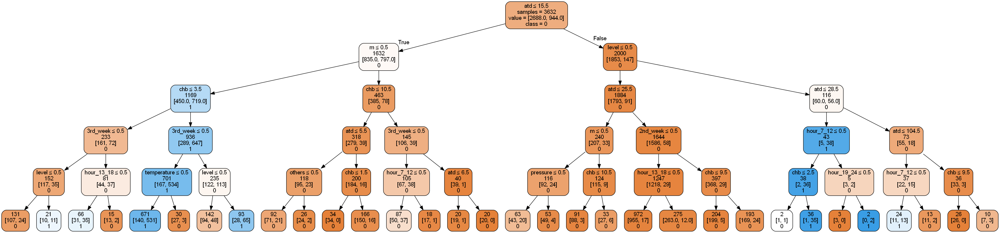

In [780]:
plotDecisionTree(evapTree, feature_names=evap_df.columns[:12], class_names=evapTree.classes_)

In [781]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_X, train_y, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.860', '0.871', '0.858', '0.851', '0.869']
Accuracy: 0.862 (+/- 0.014)
Accuracy: 0.862 (+/- 0.007)


In [782]:
# # Create a smaller classification tree for training partition using DecisionTreeClassifier() function control parameters:
# #  - Maximum Tree depth (number of splits) = 30;
# #  - Minimum impurity decrease per split = 0.01 (SIMILAR TO ADJ R SQUARE ALSO LIMIT OVERFITTING 
# #  - Minimum number of sample records in a node for splitting = 20.   ONCE YOU SPLIT HOW MANY DATA POINTS NEED TO BE THERE 
# smallClassTree = DecisionTreeClassifier(max_depth=30, 
#         min_impurity_decrease=0.01, min_samples_split=20)
# smallClassTree.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree, feature_names=train_X.columns)

In [783]:
classificationSummary(train_y, smallClassTree.predict(train_X))

Confusion Matrix (Accuracy 0.8387)

       Prediction
Actual    0    1
     0 2399  289
     1  297  647


In [784]:
# smallClassTree1 = DecisionTreeClassifier(max_depth=20, 
#         min_impurity_decrease=0.020, min_samples_split=25)
# smallClassTree1.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree1, feature_names=train_X.columns)

In [785]:
# classificationSummary(train_y, smallClassTree1.predict(train_X))

In [786]:
# smallClassTree2 = DecisionTreeClassifier(max_depth=30, 
#         min_impurity_decrease=0.001, min_samples_split=15)
# smallClassTree2.fit(train_X, train_y)

# # Display classification tree for training partition.
# print('Small Classification Tree with Control Parameters')
# plotDecisionTree(smallClassTree2, feature_names=train_X.columns)

In [787]:
# classificationSummary(train_y, smallClassTree2.predict(train_X))

In [788]:
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_X, train_y)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)


Initial score:  0.8747212022690327
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0.0005, 'min_samples_split': 20}


In [789]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(12, 26)), 
    'min_samples_split': list(range(5, 25)), 
    'min_impurity_decrease': [0.0005, 0.0006, 0.0007,0.0004], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.8810542589834824
Improved parameters:  {'max_depth': 23, 'min_impurity_decrease': 0.0004, 'min_samples_split': 10}


best Classification Tree with Control Parameters


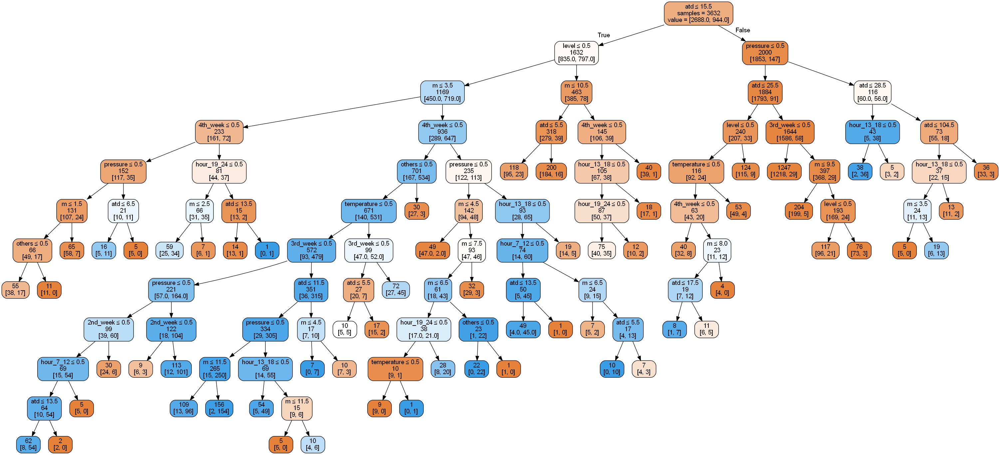

In [791]:
bestClassTree2 = DecisionTreeClassifier(max_depth=23, 
        min_impurity_decrease=0.0004, min_samples_split=10)
bestClassTree2.fit(train_X, train_y)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree2, feature_names=train_X.columns)

In [792]:
classificationSummary(train_y, bestClassTree2.predict(train_X))
classificationSummary(valid_y, bestClassTree2.predict(valid_X))

Confusion Matrix (Accuracy 0.9025)

       Prediction
Actual    0    1
     0 2566  122
     1  232  712
Confusion Matrix (Accuracy 0.8799)

       Prediction
Actual    0    1
     0 1695  102
     1  189  436


In [794]:
classificationSummary(train_y, bestClassTree.predict(train_X))


Confusion Matrix (Accuracy 0.9025)

       Prediction
Actual    0    1
     0 2566  122
     1  232  712


TOP 10 DECISION TREE

In [795]:
osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_FAL-3020', 'so_FAL-3452A', 'so_FALL-3452A',
       'so_LDAH-3708', 'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390',
       'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140'],
      dtype='object')

In [796]:
#Separate X and y variables
X_t10=osum_df.drop(columns=['chb'])
y_t10=osum_df['chb']
#Partition
train_Xt10, valid_Xt10, train_yt10, valid_yt10 = train_test_split(X_t10, y_t10, test_size=0.4, random_state=1)

In [797]:
#Develop trees
osumTree_t10 = DecisionTreeClassifier(random_state=0, max_depth=10)
osumTree_t10.fit(train_Xt10, train_yt10)
classificationSummary(train_yt10, osumTree_t10.predict(train_Xt10))

Confusion Matrix (Accuracy 0.9077)

       Prediction
Actual    0    1
     0 8872  410
     1  697 2021


In [798]:
classificationSummary(valid_yt10, osumTree_t10.predict(valid_Xt10))

Confusion Matrix (Accuracy 0.8822)

       Prediction
Actual    0    1
     0 5785  367
     1  575 1273


In [799]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Predictions from the trained model
y_pred = osumTree_t10.predict(train_Xt10)

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(train_yt10, y_pred).ravel()

# Calculate precision, recall, specificity, sensitivity
precision = precision_score(train_yt10, y_pred)
recall = recall_score(train_yt10, y_pred)
specificity = tn / (tn + fp)  # Specificity calculation
sensitivity = recall  # Sensitivity is the same as recall
accuracy = accuracy_score(train_yt10, y_pred)

# Print the results
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Accuracy: {accuracy:.4f}")


Precision: 0.8313
Recall (Sensitivity): 0.7436
Specificity: 0.9558
Accuracy: 0.9077


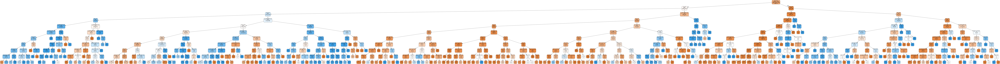

In [800]:
plotDecisionTree(osumTree_t10, feature_names=osum_df.columns[:22], class_names=osumTree_t10.classes_)

In [801]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_Xt10, train_yt10, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.891', '0.878', '0.880', '0.882', '0.878']
Accuracy: 0.882 (+/- 0.009)
Accuracy: 0.882 (+/- 0.005)


In [802]:
#grid_search
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch= GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_Xt10, train_yt10)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)



Initial score:  0.8923333333333334
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [803]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(24, 35)), 
    'min_samples_split': list(range(16, 25)), 
    'min_impurity_decrease': [0, 0.0001, 0.0005, 0.001, 0.002, 0.005], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_Xt10, train_yt10)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.8984166666666666
Improved parameters:  {'max_depth': 30, 'min_impurity_decrease': 0.0001, 'min_samples_split': 16}


best Classification Tree with Control Parameters


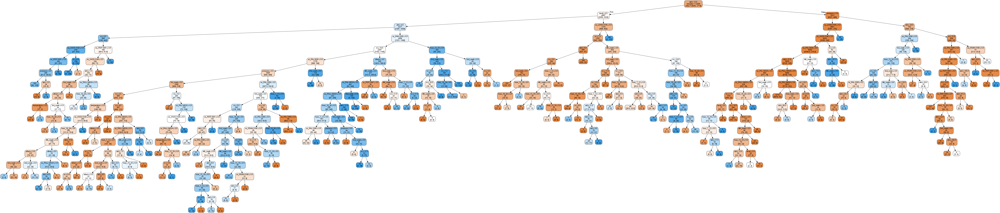

In [804]:
# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree, feature_names=train_Xt10.columns)

best Classification Tree with Control Parameters


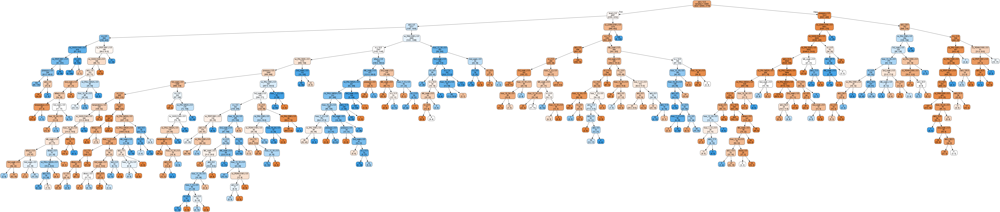

In [805]:
bestClassTreet10 = DecisionTreeClassifier(max_depth=26, 
        min_impurity_decrease=0.0001, min_samples_split=16)
bestClassTreet10.fit(train_Xt10, train_yt10)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTreet10, feature_names=train_Xt10.columns)

In [806]:
classificationSummary(valid_yt10, bestClassTreet10.predict(valid_Xt10))

Confusion Matrix (Accuracy 0.8964)

       Prediction
Actual    0    1
     0 5752  400
     1  429 1419


52 TREE

In [807]:
o_osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week',
       '4th_week', 'so_AAHH', 'so_AAL', 'so_AT', 'so_DAH', 'so_DAHH', 'so_EAL',
       'so_ESDV', 'so_FAH', 'so_FAL', 'so_FALL', 'so_FIC', 'so_FIT', 'so_FSL',
       'so_FT', 'so_HTCP', 'so_HTP', 'so_IT', 'so_KM', 'so_LAH', 'so_LAHH',
       'so_LAL', 'so_LALL', 'so_LALLL', 'so_LDAH', 'so_LIT', 'so_LSHH',
       'so_LT', 'so_MM', 'so_PAH', 'so_PAHH', 'so_PAL', 'so_PALL', 'so_PDAH',
       'so_PDIT', 'so_PIT', 'so_PM', 'so_PT', 'so_SC', 'so_ST', 'so_TAH',
       'so_TAHH', 'so_TAL', 'so_TDAH', 'so_TIT', 'so_TT', 'so_UA', 'so_UXA',
       'so_VAH', 'so_VAHH', 'so_VIT', 'so_XA', 'so_XASS', 'so_XI', 'so_XV',
       'so_ZA'],
      dtype='object')

In [808]:
#Separate X and y variables
X_o=o_osum_df.drop(columns=['chb'])
y_o=o_osum_df['chb']
#Partition
train_Xo, valid_Xo, train_yo, valid_yo = train_test_split(X_o, y_o, test_size=0.4, random_state=1)


In [809]:
#Develop trees
o_osumTree = DecisionTreeClassifier(random_state=0, max_depth=10)
o_osumTree.fit(train_Xo, train_yo)
classificationSummary(train_yo, o_osumTree.predict(train_Xo))

Confusion Matrix (Accuracy 0.9168)

       Prediction
Actual    0    1
     0 8895  387
     1  611 2107


In [810]:
#Calculate both for training data as well as validation data
classificationSummary(valid_yo, o_osumTree.predict(valid_Xo))

Confusion Matrix (Accuracy 0.8881)

       Prediction
Actual    0    1
     0 5771  381
     1  514 1334


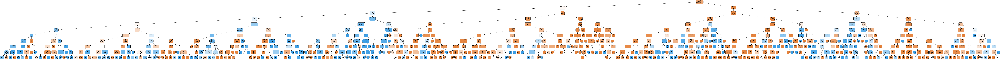

In [811]:
plotDecisionTree(o_osumTree, feature_names=o_osum_df.columns[:67], class_names=o_osumTree.classes_)

In [812]:
#cross validation

In [813]:
# Five-fold cross-validation of the full decision tree classifier
treeClassifier = DecisionTreeClassifier()

scores = cross_val_score(treeClassifier, train_Xo, train_yo, cv=5)
print('Accuracy scores of each fold: ', [f'{acc:.3f}' for acc in scores])
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std() * 2:.3f})')
print(f'Accuracy: {scores.mean():.3f} (+/- {scores.std():.3f})')

Accuracy scores of each fold:  ['0.896', '0.894', '0.897', '0.892', '0.892']
Accuracy: 0.895 (+/- 0.004)
Accuracy: 0.895 (+/- 0.002)


In [814]:
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(train_Xo, train_yo)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  0.8988333333333334
Initial parameters:  {'max_depth': 20, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [815]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(15,24 )), 
    'min_samples_split': list(range(16, 25)), 
    'min_impurity_decrease': [0, 0.0001, 0.0005, 0.001, 0.002, 0.005], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_Xo, train_yo)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.9015000000000001
Improved parameters:  {'max_depth': 21, 'min_impurity_decrease': 0.0001, 'min_samples_split': 16}


best Classification Tree with Control Parameters


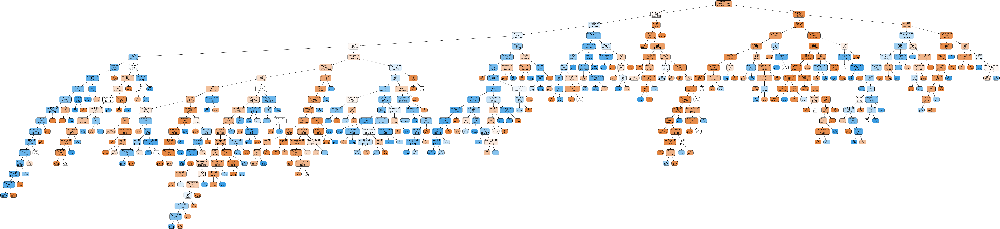

In [816]:
# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree, feature_names=train_Xo.columns)

best Classification Tree with Control Parameters


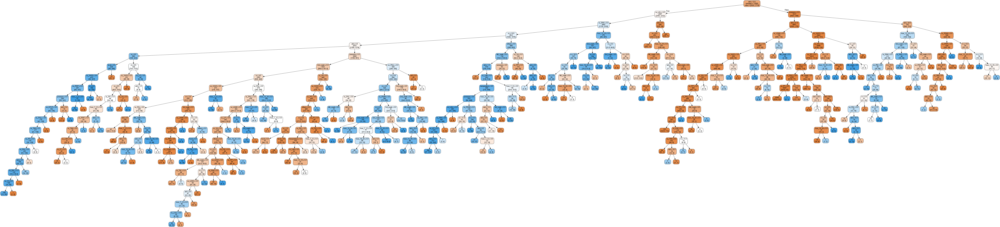

In [820]:
bestClassTree52 = DecisionTreeClassifier(max_depth=21, 
        min_impurity_decrease=0.0001, min_samples_split=16)
bestClassTree52.fit(train_Xo, train_yo)

# Display classification tree for training partition.
print('best Classification Tree with Control Parameters')
plotDecisionTree(bestClassTree52, feature_names=train_Xo.columns)

In [821]:
classificationSummary(valid_yo, bestClassTree52.predict(valid_Xo))

Confusion Matrix (Accuracy 0.9045)

       Prediction
Actual    0    1
     0 5794  358
     1  406 1442


In [822]:
rf = RandomForestClassifier(n_estimators=500, random_state=1)
rf.fit(train_Xo, train_yo)

RandomForestClassifier(n_estimators=500, random_state=1)

     feature    importance           std
0        atd  3.558855e-01  4.297831e-02
1          m  1.936772e-01  2.135372e-02
3   pressure  4.345983e-02  3.372653e-02
32    so_LAL  3.135384e-02  2.014208e-02
9   2nd_week  3.037919e-02  8.941785e-03
..       ...           ...           ...
13    so_AAL  2.402911e-07  3.224887e-06
61    so_VIT  1.020477e-07  8.021597e-07
57     so_UA  0.000000e+00  0.000000e+00
15    so_DAH  0.000000e+00  0.000000e+00
49     so_SC  0.000000e+00  0.000000e+00

[67 rows x 3 columns]


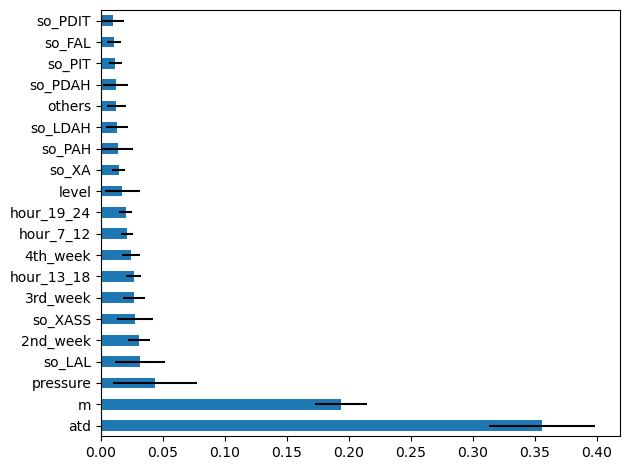

In [823]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': train_Xo.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance',ascending=False)
print(df)
# Select top 20 features
df_top20 = df.head(20)
#plt.figure(figsize=(12000, 100)) 
ax = df_top20.plot(kind='barh', xerr='std', x='feature', legend=False)

ax.set_ylabel('')
#plt.xticks(rotation=45) 
plt.tight_layout()
#plt.tight_layout(pad=20.0)
plt.show()

In [824]:
classificationSummary(valid_yo, rf.predict(valid_Xo))

Confusion Matrix (Accuracy 0.9154)

       Prediction
Actual    0    1
     0 5843  309
     1  368 1480


In [825]:
boost = GradientBoostingClassifier()
boost.fit(train_Xo, train_yo)

GradientBoostingClassifier()

In [826]:
classificationSummary(valid_yo, boost.predict(valid_Xo))

Confusion Matrix (Accuracy 0.8855)

       Prediction
Actual    0    1
     0 5731  421
     1  495 1353


In [827]:
##CLEANING TRAINING DATA

# Display current column names
print("Original Column Names:", osum_df.columns.tolist())

# Clean the column names
a_osum_df.columns = (
    a_osum_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", a_osum_df.columns.tolist())

Original Column Names: ['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others', 'hour_7_12', 'hour_13_18', 'hour_19_24', '2nd_week', '3rd_week', '4th_week', 'so_FAL-3020', 'so_FAL-3452A', 'so_FALL-3452A', 'so_LDAH-3708', 'so_PAH-3200', 'so_PAL-3356', 'so_PAL-3390', 'so_PDAH-3190', 'so_PDIT-3091', 'so_XASS-3140']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [828]:
drop_columns = ['alarm_tag_type', 'flow','h', 'hour_0_6','1st_week']

# Drop the specified columns
a_osum_df = a_osum_df.drop(columns=drop_columns)

In [829]:
#convert to dummy variables
a_osum_df = pd.get_dummies(a_osum_df, prefix_sep='_',dtype = 'int',drop_first=True)
a_osum_df.columns

Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24',
       ...
       'so_XV-3468', 'so_XV-3471', 'so_XV-3475', 'so_XV-3481', 'so_XV-3702B',
       'so_XV-3732', 'so_ZA-3502', 'week_2nd Week', 'week_3rd Week',
       'week_4th Week'],
      dtype='object', length=475)

In [830]:
# Save feature names after training
feature_names = a_osum_df.columns

In [831]:
a_osum_df.chb = a_osum_df.chb.astype('category')
print(a_osum_df.chb.dtype)
a_osum_df.head()

category


,atd,chb,m,level,pressure,temperature,others,hour_7_12,hour_13_18,hour_19_24,...,so_XV-3468,so_XV-3471,so_XV-3475,so_XV-3481,so_XV-3702B,so_XV-3732,so_ZA-3502,week_2nd Week,week_3rd Week,week_4th Week
0,0,0,6,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,7,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,10,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,10,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [832]:
#Separate X and y variables
X=a_osum_df.drop(columns=['chb'])
y =a_osum_df['chb']

In [833]:
#Fit and print results
logit_reg = sm.GLM(y, X, family=sm.families.Binomial())
logit_reg.fit()
print(logit_reg.fit().summary())

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1056: RuntimeWarning: divide by zero encountered in log
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1056: RuntimeWarning: invalid value encountered in multiply
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +


                 Generalized Linear Model Regression Results                  
Dep. Variable:                    chb   No. Observations:                20000
Model:                            GLM   Df Residuals:                    19532
Model Family:                Binomial   Df Model:                          467
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Wed, 20 Nov 2024   Deviance:                   2.3975e+05
Time:                        21:08:32   Pearson chi2:                 1.17e+19
No. Iterations:                   100   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
atd             -1.9e+12   1278.239  -1.49e+09

In [834]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [835]:
# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

intercept  -3.2749877676345074
            atd         m     level  pressure  temperature    others  \
coeff -0.003546  0.065855 -0.539089  0.635792    -0.389355 -1.111832   

       hour_7_12  hour_13_18  hour_19_24  2nd_week  ...  so_XV-3468  \
coeff   0.088399    -0.16533    0.296004  0.046186  ...   -0.219818   

       so_XV-3471  so_XV-3475  so_XV-3481  so_XV-3702B  so_XV-3732  \
coeff   -0.132325   -0.899704   -0.506899    -0.017126         0.0   

       so_ZA-3502  week_2nd Week  week_3rd Week  week_4th Week  
coeff   -0.198201       0.046186       0.368306       0.011753  

[1 rows x 474 columns]

AIC 5042.043164696468


In [836]:
logit_reg_pred = logit_reg.predict(valid_X)
logit_reg_proba = logit_reg.predict_proba(valid_X)
logit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in logit_reg_proba],
                             'p(1)': [p[1] for p in logit_reg_proba],
                             'predicted': logit_reg_pred })


In [837]:
#Use the classification summary function for training and validation data
classificationSummary(valid_y, logit_reg_pred)

Confusion Matrix (Accuracy 0.9024)

       Prediction
Actual    0    1
     0 5690  462
     1  319 1529


In [838]:
### NEW DATA #####

In [839]:
file_path = 'newdata.xlsx'

In [840]:
new_df = pd.read_excel(file_path, sheet_name='Sheet1')

In [841]:
a_new_df=new_df.copy()

In [842]:
# Display current column names
print("Original Column Names:", new_df.columns.tolist())

# Clean the column names
a_new_df.columns = (
    a_new_df.columns
    .str.strip()                # Remove leading and trailing spaces
    .str.lower()                # Convert to lowercase
    .str.replace(' ', '_')      # Replace spaces with underscores
    .str.replace(':', '_')      # Replace colons with underscores
    .str.replace('-', '_')      # Replace hyphens with underscores
    .str.replace(r'[^a-zA-Z0-9_]', '', regex=True)  # Remove special characters
)

# Display cleaned column names
print("Cleaned Column Names:", a_new_df.columns.tolist())

Original Column Names: ['SO', 'ATD', 'CHB', 'M', 'Alarm Tag Type', 'Flow', 'Level', 'Pressure', 'Temperature', 'Others', 'H', 'Hour:0-6', 'Hour:7-12', 'Hour:13-18', 'Hour:19-24', 'Week', '1st Week', '2nd week', '3rd week', '4th week']
Cleaned Column Names: ['so', 'atd', 'chb', 'm', 'alarm_tag_type', 'flow', 'level', 'pressure', 'temperature', 'others', 'h', 'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', 'week', '1st_week', '2nd_week', '3rd_week', '4th_week']


In [843]:
#convert to dummy variables
a_new_df = pd.get_dummies(a_new_df, prefix_sep='_',dtype = 'int',drop_first=True)
a_new_df.columns

Index(['atd', 'chb', 'm', 'flow', 'level', 'pressure', 'temperature', 'others',
       'hour_0_6', 'hour_7_12', 'hour_13_18', 'hour_19_24', '1st_week',
       '2nd_week', '3rd_week', '4th_week', 'so_FAL-3110', 'so_FIT-3480',
       'so_XI-3057', 'alarm_tag_type_Others', 'alarm_tag_type_Pressure',
       'h_13-18', 'h_19-24', 'week_2nd Week', 'week_3rd Week',
       'week_4th Week'],
      dtype='object')

In [844]:
a_new_df.shape

(5, 26)

In [845]:
a_new_df.chb = a_new_df.chb.astype('category')
print(a_new_df.chb.dtype)
a_new_df.head()

category


,atd,chb,m,flow,level,pressure,temperature,others,hour_0_6,hour_7_12,...,so_FAL-3110,so_FIT-3480,so_XI-3057,alarm_tag_type_Others,alarm_tag_type_Pressure,h_13-18,h_19-24,week_2nd Week,week_3rd Week,week_4th Week
0,1,0,6,0,0,0,0,1,1,0,...,1,0,0,1,0,0,0,0,0,1
1,10,1,10,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
2,1,0,7,1,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
3,2,0,7,1,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
4,1,0,12,0,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0


In [846]:
# Align new data with the training data's columns
a_new_df_aligned = a_new_df.reindex(columns=a_osum_df.columns, fill_value=0)
a_new_df_aligned.columns



Index(['atd', 'chb', 'm', 'level', 'pressure', 'temperature', 'others',
       'hour_7_12', 'hour_13_18', 'hour_19_24',
       ...
       'so_XV-3468', 'so_XV-3471', 'so_XV-3475', 'so_XV-3481', 'so_XV-3702B',
       'so_XV-3732', 'so_ZA-3502', 'week_2nd Week', 'week_3rd Week',
       'week_4th Week'],
      dtype='object', length=475)

In [847]:
#Separate X and y variables
test_X=a_new_df_aligned.drop(columns=['chb'])
test_y =a_new_df_aligned['chb']

In [848]:
new_reg_pred = logit_reg.predict(test_X)
new_reg_proba = logit_reg.predict_proba(test_X)
new_result = pd.DataFrame({'actual': test_y, 
                             'p(0)': [p[0] for p in new_reg_proba],
                             'p(1)': [p[1] for p in new_reg_proba],
                             'predicted': new_reg_pred })


In [849]:
print(new_result)

  actual      p(0)      p(1)  predicted
0      0  0.962935  0.037065          0
1      1  0.938477  0.061523          0
2      0  0.968382  0.031618          0
3      0  0.956120  0.043880          0
4      0  0.753222  0.246778          0


In [850]:
#Use the classification summary function for training and validation data
classificationSummary(test_y, new_reg_pred)

Confusion Matrix (Accuracy 0.8000)

       Prediction
Actual 0 1
     0 4 0
     1 1 0


In [851]:
# Calculate odds
odds = [p[1] / p[0] if p[0] != 0 else float('inf') for p in new_reg_proba]

# Create a DataFrame with actual, probabilities, predicted, and odds
new_result = pd.DataFrame({
    'actual': test_y, 
    'p(0)': [p[0] for p in new_reg_proba],
    'p(1)': [p[1] for p in new_reg_proba],
    'odds': odds,
    'predicted': new_reg_pred
})

# Display the first few rows of the DataFrame
print(new_result.head())


  actual      p(0)      p(1)      odds  predicted
0      0  0.962935  0.037065  0.038492          0
1      1  0.938477  0.061523  0.065556          0
2      0  0.968382  0.031618  0.032650          0
3      0  0.956120  0.043880  0.045894          0
4      0  0.753222  0.246778  0.327630          0
